<a href="https://colab.research.google.com/github/LindsClar/Capstone-3/blob/main/EDA_Coffee_Sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analyzing Coffee Sales

Coffee is my favorite drug, and as a mom, it's the drug I drink daily. I especially love my coffee when someone else makes it. Through these Coffee sales I will be cleaning and organizing the data to assist my favorite businesses.

Data: https://www.kaggle.com/code/ahmedabbas757/coffee-shop-sales/input

Table of contents
  - Import libraries
  - Import Data
  - Analyze data
  - Shaping the Data
    - Renaming and removing unneccessary data




In [55]:
#import all my libraries

import os
import numpy as np
import sklearn

import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import pandas as pd
import plotly.express as px
from datetime import datetime
from datetime import time

from sklearn.model_selection import train_test_split

from statsmodels.tsa.seasonal import seasonal_decompose

import plotly.express as px
import plotly.graph_objects as go
import itertools

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import KernelPCA

import math
import keras
import tensorflow as tf

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.api as smt

import warnings
warnings.filterwarnings('ignore')

tf.random.set_seed(99)

Reading in the Data

In [56]:
#importing data
df = pd.read_excel('/content/Coffee Shop Sales.xlsx')

Analyzing the DF.

In [57]:
df.head(20)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
5,6,2023-01-01,07:22:41,1,5,Lower Manhattan,77,3.00,Bakery,Scone,Oatmeal Scone
6,7,2023-01-01,07:25:49,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm
7,8,2023-01-01,07:33:34,2,5,Lower Manhattan,28,2.00,Coffee,Gourmet brewed coffee,Columbian Medium Roast Sm
8,9,2023-01-01,07:39:13,1,5,Lower Manhattan,39,4.25,Coffee,Barista Espresso,Latte Rg
9,10,2023-01-01,07:39:34,2,5,Lower Manhattan,58,3.50,Drinking Chocolate,Hot chocolate,Dark chocolate Rg


Now that the Data a loaded, it's time to analyze the data to determine how we'll approach it. I see above that there a lot of columns that aren't necceary so I will be dropping them down below. This will streamline the data necceary.

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


In [59]:
df.shape

(149116, 11)

In [60]:
df.isnull()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
149111,False,False,False,False,False,False,False,False,False,False,False
149112,False,False,False,False,False,False,False,False,False,False,False
149113,False,False,False,False,False,False,False,False,False,False,False
149114,False,False,False,False,False,False,False,False,False,False,False


# Transforming the Data
Looking through the data, there are a few changes I plan to make to better organize how the DataFrame is presented.

Based on how the data is currently structured, I’ve decided to take a different approach instead of melting or pivoting the data. I will narrow down the data first and then expand the columns that track the time periods and restaurants.

I’ll start by creating a column to track the time periods. Then, I will expand the store information to include separate columns for each restaurant. The goal is to clean the data thoroughly and reshape it so that it aligns with key metrics like the time of day (period), day of the week, and specific dates, making it easier to analyze.

In [61]:
df.rename(columns={'unit_price': 'Price','transaction_qty': 'Qty','transaction_date': 'Date', 'transaction_time': 'Time', 'store_location': 'Store','product_category': 'Product'}, inplace=True)

In [62]:
df.head()

,transaction_id,Date,Time,Qty,store_id,Store,product_id,Price,Product,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


In [63]:
#Product category and Product type are extremely similar
df = df.drop(columns=['product_type', 'transaction_id','store_id', 'product_id', 'product_detail'])
df.head(20)

,Date,Time,Qty,Store,Price,Product
0,2023-01-01,07:06:11,2,Lower Manhattan,3.00,Coffee
1,2023-01-01,07:08:56,2,Lower Manhattan,3.10,Tea
2,2023-01-01,07:14:04,2,Lower Manhattan,4.50,Drinking Chocolate
3,2023-01-01,07:20:24,1,Lower Manhattan,2.00,Coffee
4,2023-01-01,07:22:41,2,Lower Manhattan,3.10,Tea
5,2023-01-01,07:22:41,1,Lower Manhattan,3.00,Bakery
6,2023-01-01,07:25:49,1,Lower Manhattan,2.00,Coffee
7,2023-01-01,07:33:34,2,Lower Manhattan,2.00,Coffee
8,2023-01-01,07:39:13,1,Lower Manhattan,4.25,Coffee
9,2023-01-01,07:39:34,2,Lower Manhattan,3.50,Drinking Chocolate


 I don't like how the table has a lot more NaN, also should I use .melt? I was thinking of seperating

Note: the product category to create three or 4 smaller df by category
  Product Category
    - Coffee
    - Tea
    - Drinking coffee
    - Bakery

  While going throught the code, I went back and decided to classify by resturant and not focusing on coffee. I would like to see the sales of each Item and analyse what sells the most throughout the day

In [64]:
#locate duplicates
duplicates = df.duplicated()
df.loc[duplicates, :]

,Date,Time,Qty,Store,Price,Product
3256,2023-01-07,07:00:50,1,Lower Manhattan,3.75,Bakery
3438,2023-01-07,09:31:48,1,Hell's Kitchen,3.75,Bakery
3508,2023-01-07,10:29:12,1,Lower Manhattan,3.75,Bakery
3509,2023-01-07,10:29:12,1,Lower Manhattan,3.75,Bakery
3835,2023-01-08,07:30:17,1,Lower Manhattan,4.25,Coffee
...,...,...,...,...,...,...
148471,2023-06-30,09:49:35,1,Hell's Kitchen,3.75,Bakery
148610,2023-06-30,10:34:30,1,Lower Manhattan,3.75,Bakery
148701,2023-06-30,11:18:31,1,Hell's Kitchen,3.25,Bakery
148717,2023-06-30,11:24:35,1,Hell's Kitchen,3.75,Bakery


While price point, quantity, and product are all the same, which could indicate a duplicate, we need to consider the time of purchase. It appears that many of these products are purchased at different times, except for a few rows like 148718 and 148717. I will investigate this further as I clean the data and focus on a single store.

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype         
---  ------   --------------   -----         
 0   Date     149116 non-null  datetime64[ns]
 1   Time     149116 non-null  object        
 2   Qty      149116 non-null  int64         
 3   Store    149116 non-null  object        
 4   Price    149116 non-null  float64       
 5   Product  149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(3)
memory usage: 6.8+ MB


In [66]:
#checking shape of DF
df.shape

(149116, 6)

Examing Unique values and missing values to drop

In [67]:
df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S').dt.time


In [68]:
#new column to create a distinct period of time morning, day, night
df['Period'] = pd.cut(
    pd.to_datetime(df['Time'], format='%H:%M:%S').dt.hour,
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],  # Corrected labels
    right=False  # Use right=False to ensure that 24:00 falls into the last bin
)

In [69]:
#inspect
df.head(5)

,Date,Time,Qty,Store,Price,Product,Period
0,2023-01-01,07:06:11,2,Lower Manhattan,3.0,Coffee,Morning
1,2023-01-01,07:08:56,2,Lower Manhattan,3.1,Tea,Morning
2,2023-01-01,07:14:04,2,Lower Manhattan,4.5,Drinking Chocolate,Morning
3,2023-01-01,07:20:24,1,Lower Manhattan,2.0,Coffee,Morning
4,2023-01-01,07:22:41,2,Lower Manhattan,3.1,Tea,Morning


In [70]:
#ensuring format of time in the df
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

In [71]:
df.loc[:, 'Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

In [72]:
df.head(5)

,Date,Time,Qty,Store,Price,Product,Period
0,2023-01-01,07:06:11,2,Lower Manhattan,3.0,Coffee,Morning
1,2023-01-01,07:08:56,2,Lower Manhattan,3.1,Tea,Morning
2,2023-01-01,07:14:04,2,Lower Manhattan,4.5,Drinking Chocolate,Morning
3,2023-01-01,07:20:24,1,Lower Manhattan,2.0,Coffee,Morning
4,2023-01-01,07:22:41,2,Lower Manhattan,3.1,Tea,Morning


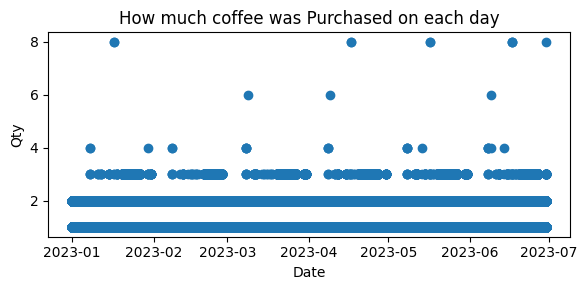

In [73]:
#now I can plot the date to product purchase
plt.figure(figsize=(6,3))
plt.scatter(df['Date'], df['Qty'])
plt.xlabel('Date')
plt.ylabel('Qty')
plt.title('How much coffee was Purchased on each day')
plt.tight_layout()
plt.show()

In [74]:
fig = px.line(df, x='Date', y='Qty', title='How much Product is normally was Purchased Over 7 Months')
fig.show()

With the plotting above I can see how purchase across the time line of 7 months is. We can also see how many coffee's customers purchase. I believe that there is different overlay between each resturant so I will be eliminating two of the three resturants so that we can inspect the variable of the items in one resturants.

In [75]:
df = df[df['Store']=="Astoria"]

In [76]:
df.head()
df.shape

(50599, 7)

In [77]:
duplicates_df = df.duplicated()
duplicates_df

,0
105,False
106,False
107,False
111,False
113,False
...,...
149103,False
149104,False
149105,False
149107,False


Checking duplicates again in the df.

In [78]:
#the new column day_type
df['day_type'] = df['Date'].dt.day_name()

In [79]:
#filling the column with the type of week ie. weekend and weekday
df['day_type'] = df['Date'].dt.weekday.apply(lambda x: 'Weekday' if x < 5 else 'Weekend')

In [80]:
#inspecting
df.head(5)

,Date,Time,Qty,Store,Price,Product,Period,day_type
105,2023-01-01,11:01:48,1,Astoria,2.00,Coffee,Morning,Weekend
106,2023-01-01,11:01:58,1,Astoria,3.75,Coffee,Morning,Weekend
107,2023-01-01,11:01:58,1,Astoria,3.50,Bakery,Morning,Weekend
111,2023-01-01,11:08:11,1,Astoria,4.50,Drinking Chocolate,Morning,Weekend
113,2023-01-01,11:09:01,1,Astoria,4.50,Drinking Chocolate,Morning,Weekend


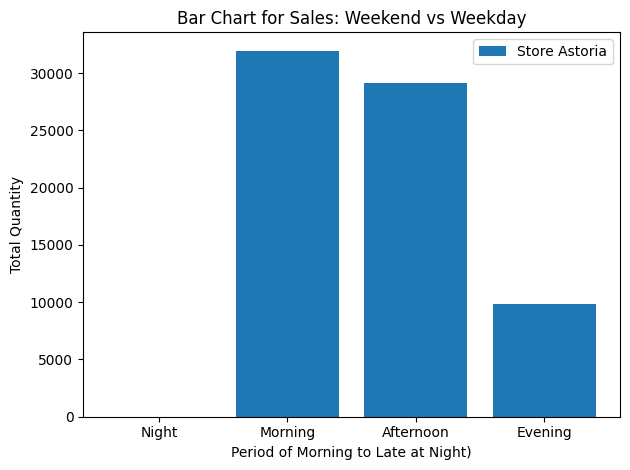

In [81]:
fig, ax = plt.subplots()

#"Period" * "Store" = "Qty"
grouped = df.groupby(["Period", "Store"])["Qty"].sum().reset_index()

#creating bar chart
for store in grouped["Store"].unique():
    store_data = grouped[grouped["Store"] == store]
    ax.bar(store_data["Period"], store_data["Qty"], label=f"Store {store}")

#labelling
ax.set_xlabel("Period of Morning to Late at Night)")
ax.set_ylabel("Total Quantity")
ax.set_title("Bar Chart for Sales: Weekend vs Weekday")
ax.legend()

#plot
plt.tight_layout()
plt.show()

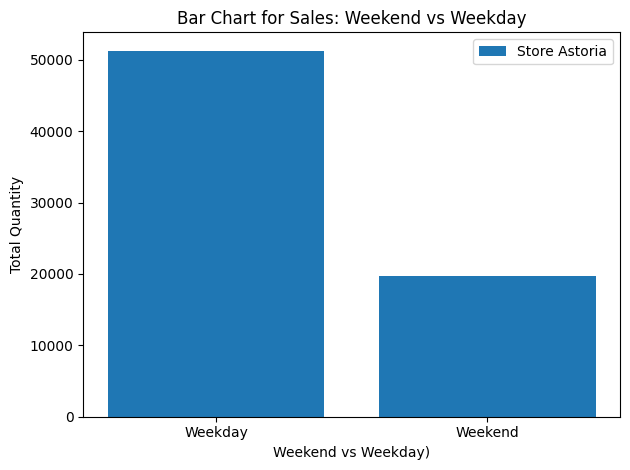

In [82]:
fig, ax = plt.subplots()

# Grouping by "Period" and "Store" to calculate total quantity
grouped = df.groupby(["day_type", "Store"])["Qty"].sum().reset_index()

# Creating the bar chart
for store in grouped["Store"].unique():
    store_data = grouped[grouped["Store"] == store]
    ax.bar(store_data["day_type"], store_data["Qty"], label=f"Store {store}")

# Labelling
ax.set_xlabel("Weekend vs Weekday)")
ax.set_ylabel("Total Quantity")
ax.set_title("Bar Chart for Sales: Weekend vs Weekday")
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

With the bar chart above we can see the difference in sales in Astoria on the weekdays vs the weekends

In [83]:
fig = px.scatter(df, x='Date', y='Period', color='Product', hover_data={'Date': '|%B %d, %Y'}, title='Products in Astoria'
)

fig.update_xaxes(dtick="M1", tickformat="%b\n%Y")

fig.show()


In [84]:
df.head(5)

,Date,Time,Qty,Store,Price,Product,Period,day_type
105,2023-01-01,11:01:48,1,Astoria,2.00,Coffee,Morning,Weekend
106,2023-01-01,11:01:58,1,Astoria,3.75,Coffee,Morning,Weekend
107,2023-01-01,11:01:58,1,Astoria,3.50,Bakery,Morning,Weekend
111,2023-01-01,11:08:11,1,Astoria,4.50,Drinking Chocolate,Morning,Weekend
113,2023-01-01,11:09:01,1,Astoria,4.50,Drinking Chocolate,Morning,Weekend


While looking through all my Data, I realized that I truly need to analyze each location for the sales. I see through this Data that I need to analyze each location to truly understand the sales per location.

In [85]:
df['datetime'] = pd.to_datetime(df['Date'].dt.strftime('%Y-%m-%d') + ' ' + df['Time'].astype(str))

In [86]:
specific_date = '2023-01-01'
plot_data = df[df['Date'] == specific_date]

#Overview

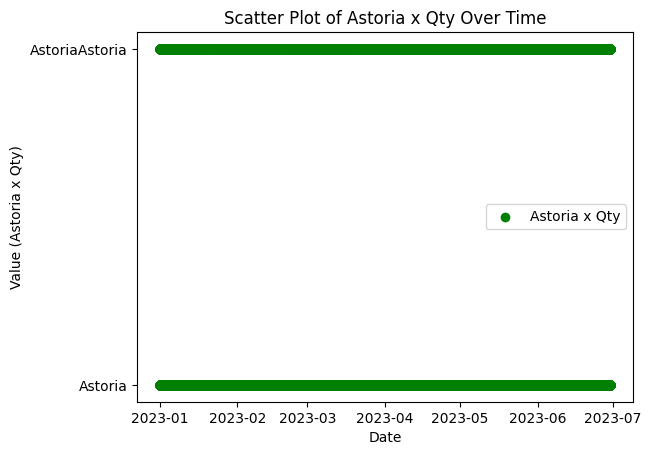

In [87]:
#scatter plot
fig, ax = plt.subplots()
ax.scatter(df["Date"], df["Store"] * df["Qty"], c="green", label="Astoria x Qty")

#labelling
ax.set_xlabel("Date")
ax.set_ylabel("Value (Astoria x Qty)")
ax.set_title("Scatter Plot of Astoria x Qty Over Time")
ax.legend()

#show
plt.show()

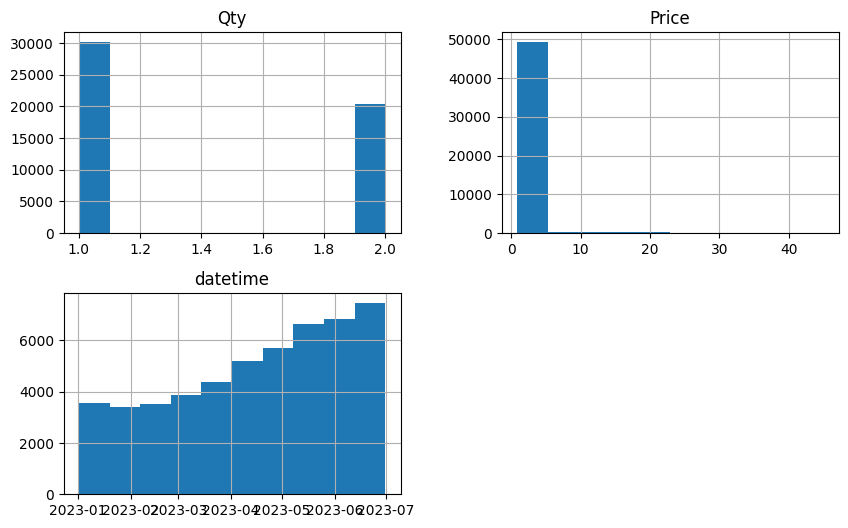

In [88]:
df_hist = df.drop(columns=['Date'],axis=1)
df_hist.hist(figsize=(10,6));

In [89]:
duplicate_dates = df[df['Date'].duplicated()]
print(duplicate_dates)

             Date      Time  Qty    Store  Price             Product   Period  \
106    2023-01-01  11:01:58    1  Astoria   3.75              Coffee  Morning   
107    2023-01-01  11:01:58    1  Astoria   3.50              Bakery  Morning   
111    2023-01-01  11:08:11    1  Astoria   4.50  Drinking Chocolate  Morning   
113    2023-01-01  11:09:01    1  Astoria   4.50  Drinking Chocolate  Morning   
114    2023-01-01  11:10:21    1  Astoria   3.00                 Tea  Morning   
...           ...       ...  ...      ...    ...                 ...      ...   
149103 2023-06-30  19:51:59    2  Astoria   3.00              Coffee  Evening   
149104 2023-06-30  19:52:28    2  Astoria   2.45              Coffee  Evening   
149105 2023-06-30  19:53:46    1  Astoria   3.00              Coffee  Evening   
149107 2023-06-30  19:57:49    2  Astoria   2.50                 Tea  Evening   
149108 2023-06-30  19:57:49    1  Astoria   3.25              Bakery  Evening   

       day_type            

In [90]:
print(df.dtypes)

Date        datetime64[ns]
Time                object
Qty                  int64
Store               object
Price              float64
Product             object
Period            category
day_type            object
datetime    datetime64[ns]
dtype: object


Now that I've wrangled and shaped the data to my liking, I can begin the EDA process in the next phase of the capstone project. During the EDA process, I will explore the differences in sales based on the time of day and location. Specifically, I will analyze sales trends for different times of the day to identify patterns and variations. Furthermore, I will delve deeper into forecasting future sales and exploring potential improvements through modeling.

In [91]:
df['profits'] = df['Price'] * df['Qty']

In [92]:
Q1 = df['profits'].quantile(0.25)
Q3 = df['profits'].quantile(0.75)
IQR = Q3 - Q1

In [93]:
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [94]:
outliers = df[(df['profits'] < lower_bound) | (df['profits'] > upper_bound)]
print("Outliers:\n", outliers)

Outliers:
              Date      Time  Qty    Store  Price       Product     Period  \
4067   2023-01-08  10:44:10    1  Astoria  14.75  Coffee beans    Morning   
4199   2023-01-08  14:02:53    1  Astoria  10.95     Loose Tea  Afternoon   
4299   2023-01-08  17:48:46    1  Astoria  18.00  Coffee beans  Afternoon   
4359   2023-01-08  19:54:56    1  Astoria  14.00       Branded    Evening   
4462   2023-01-09  07:59:55    1  Astoria  21.00  Coffee beans    Morning   
...           ...       ...  ...      ...    ...           ...        ...   
148248 2023-06-30  08:23:59    1  Astoria  14.00       Branded    Morning   
148659 2023-06-30  10:53:26    1  Astoria  10.95     Loose Tea    Morning   
148680 2023-06-30  10:58:22    1  Astoria  14.00       Branded    Morning   
148927 2023-06-30  15:59:13    1  Astoria  19.75  Coffee beans  Afternoon   
149064 2023-06-30  18:49:29    1  Astoria  14.75  Coffee beans    Evening   

       day_type            datetime  profits  
4067    Weekend 2

In [95]:
fig = px.pie(outliers, values='profits', names='Product', title='Purchase Outliers', color_discrete_sequence=px.colors.sequential.RdBu
)
fig.show()

This is a really interesting demonstration of product sales and the transactions that produced the outliers. The products that likely remain in stock at Astoria without requiring significant effort from employees tend to represent the highest and lowest purchase amounts, which are identified as outliers. These dried products, such as coffee beans and loose tea, have a long shelf life, so they don’t significantly impact the workload of employees unless they are made in-house.
Revenue analysis shows that the outliers account for  16,307.86 𝑜𝑣𝑒𝑟 𝑎 7−𝑚𝑜𝑛𝑡ℎ 𝑝𝑒𝑟𝑖𝑜𝑑, 𝑐𝑜𝑚𝑝𝑎𝑟𝑒𝑑 𝑡𝑜 𝑡ℎ𝑒 𝑡𝑜𝑡𝑎𝑙 𝑝𝑟𝑜𝑓𝑖𝑡𝑠 𝑜𝑓 232,243.91. I’d like to narrow the impact of these outliers by removing those values to improve future forecasting and provide greater consistency in the dataset.

In [96]:
df = df.drop(outliers.index)

In [97]:
df.shape

(49774, 10)

With this we went from 149116 to 49,774 transactions

This is a really interesting demonstration of product sales and the transactions that produced the outliers. The products that are likely to remain in stock at Astoria with minimal effort from the shop tend to generate both the highest and lowest purchases. These dried products, like coffee beans and loose tea, have a long shelf life.

Now that I've wrangled and shaped the data to my liking, I can begin the EDA process in the next phase of the capstone project. During the EDA process, I will explore the differences in sales based on the time of day and location. Specifically, I will analyze sales trends for different times of the day to identify patterns and variations. Furthermore, I will delve deeper into forecasting future sales and exploring potential improvements through modeling.

#Exploring and Data Analysis

While wrangling the data i was able to evaluate that the sales from close up shows that there's consistent sales everyday. Now we want to truly explore the data of each variable.

In [98]:
print(df.columns)

Index(['Date', 'Time', 'Qty', 'Store', 'Price', 'Product', 'Period',
       'day_type', 'datetime', 'profits'],
      dtype='object')


In [99]:
fig = px.pie(df, values='profits', names='Product', title='Sales by Product', color_discrete_sequence=px.colors.sequential.RdBu
)
fig.show()

The graph above presents that the vas majority of sales over a 7 month period are from coffee and tea. Now lets take a look how sales shift in the evening

In [100]:
morning_df = df[df['Period']=='Morning']
evening_df = df[df['Period']=='Evening']

In [101]:
fig = px.pie(morning_df, values='profits', names='Product', title='Sales of Product in the Morning', color_discrete_sequence=px.colors.sequential.RdBu
)
fig.show()

Now lets compare it to the evening sales for the last 7 months

In [102]:
fig = px.pie(evening_df, values='profits', names='Product', title='Sales of Product in the Evening', color_discrete_sequence=px.colors.sequential.RdBu
)

fig.show()

In [103]:
#total revenue
Morning_profits = morning_df.groupby('Period')['profits'].sum().reset_index()
Evening_profits = evening_df.groupby('Period')['profits'].sum().reset_index()

print(Morning_profits)
print(Evening_profits)

      Period   profits
0      Night      0.00
1    Morning  95922.05
2  Afternoon      0.00
3    Evening      0.00
      Period  profits
0      Night      0.0
1    Morning      0.0
2  Afternoon      0.0
3    Evening  30240.1


I find the evening sales interesting because I would have expected a more dramatic shift toward customers purchasing either chocolate or tea during that time. However, 41% of sales being attributed to coffee still represents a significant portion of evening profits.

The difference in sales between the morning and evening is notable, as morning profits more than double those of the evening. This demonstrates that Astoria’s most consistent customers visit during the morning hours.

Let’s move forward and compare the profits to examine the differences between weekends and weekdays for Astoria.



In [104]:
Weekend_df = df[df['day_type']=='Weekend']
Weekday_df = df[df['day_type']=='Weekday']


#revenue sum
Weekday_df_profits = Weekday_df.groupby('day_type')['profits'].sum().reset_index()
Weekend_df_profits = Weekend_df.groupby('day_type')['profits'].sum().reset_index()

print(Weekday_df_profits)
print(Weekend_df_profits)

  day_type   profits
0  Weekday  156191.5
  day_type   profits
0  Weekend  59744.55


In [105]:
fig = px.scatter(Weekday_df, x="Date", y="profits", color="Product", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

While looking at the information from Weekdays I see that there are consistant sales with coffee and tea, which makes sense because that's what Astoria is none for. Sales show consistent for the weekday.

In [106]:
fig = px.scatter(Weekend_df, x="Date", y="profits", color="Product", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

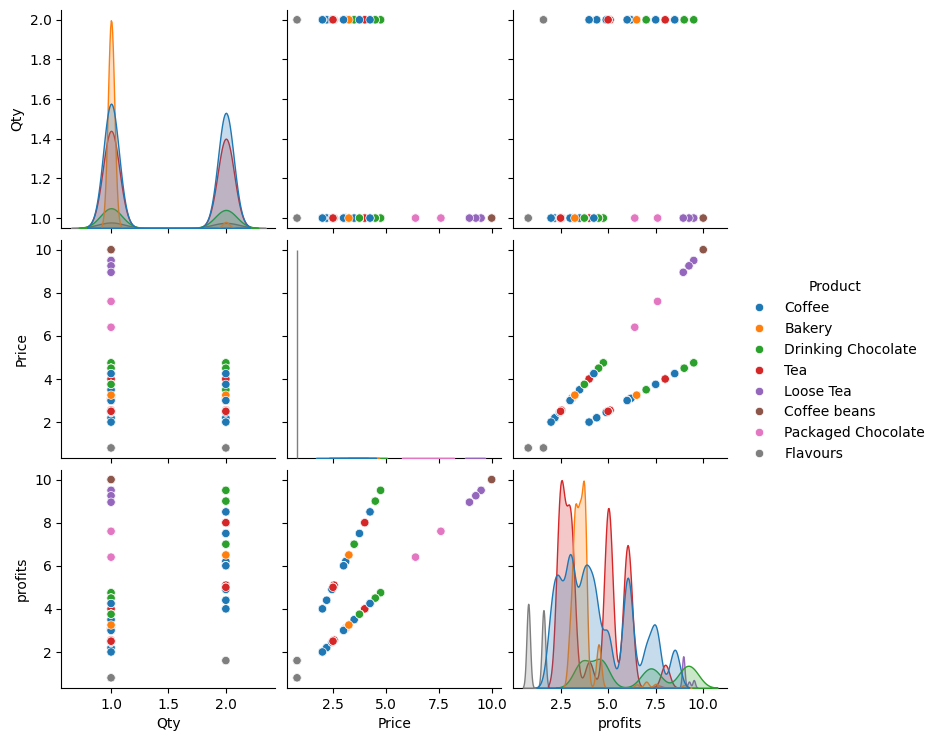

In [107]:
sns.pairplot(df, hue="Product")

Through careful analysis, I can see that the time periods with the lowest profits are evenings and weekends. Additionally, the products offered by Astoria that generate the lowest profits include branded items, loose tea, flavored products, and packaged chocolate.

It is also worth noting that shelf items, which may be displayed at the front of the coffee shop, tend to sell the least but have the highest outliers in terms of revenue. This insight suggests a potential low-effort opportunity to increase sales.

The analysis further shows that coffee and tea have consistent sales throughout the day but experience a significant boost in the morning.

Sales decline in the evening, which may present a hidden opportunity to host events such as tastings or to inspire customers to purchase more shelf items that yield higher revenue. These are small changes of the sales that need to be noted for future suggesttions and to make note of for possible suggestions for Astoria.

Other small changes to increase the consistent sales show over a 7 month period would be openning at 6am from 7am. This allows for customers that work early hours during the cold morning to have a a nice cup of Joe.

Now that we have some understanding and exploration of our data we can can expand through some modelling and forecasting.